In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import linear_model
from sklearn.linear_model import LinearRegression


In [2]:
# setting the path for joining multiple files
files = os.path.join("Resources/City Temp data","CityTs_*.csv")

# list of merged files returned
files = glob.glob(files)

print("Resultant CSV after joining all CSV files at a particular location...");

# joining files with concat and read_csv
dfTemp = pd.concat(map(pd.read_csv, files), ignore_index=True)
print(dfTemp)

Resultant CSV after joining all CSV files at a particular location...
         Region   Country State        City  Month  Day  Year  AvgTemperature
0        Africa   Algeria   NaN     Algiers      1    1  1995            64.2
1        Africa   Algeria   NaN     Algiers      1    2  1995            49.4
2        Africa   Algeria   NaN     Algiers      1    3  1995            48.8
3        Africa   Algeria   NaN     Algiers      1    4  1995            46.4
4        Africa   Algeria   NaN     Algiers      1    5  1995            47.9
...         ...       ...   ...         ...    ...  ...   ...             ...
2906322  Europe  Slovakia   NaN  Bratislava     12    8  2010            39.2
2906323  Europe  Slovakia   NaN  Bratislava     12    9  2010            36.4
2906324  Europe  Slovakia   NaN  Bratislava     12   10  2010            30.7
2906325  Europe  Slovakia   NaN  Bratislava     12   11  2010            32.8
2906326  Europe  Slovakia   NaN  Bratislava     12   12  2010           

In [3]:
dfTemp=dfTemp[['Country','City','Month','Day','Year','AvgTemperature']].copy()
dfTemp

,Country,City,Month,Day,Year,AvgTemperature
0,Algeria,Algiers,1,1,1995,64.2
1,Algeria,Algiers,1,2,1995,49.4
2,Algeria,Algiers,1,3,1995,48.8
3,Algeria,Algiers,1,4,1995,46.4
4,Algeria,Algiers,1,5,1995,47.9
...,...,...,...,...,...,...
2906322,Slovakia,Bratislava,12,8,2010,39.2
2906323,Slovakia,Bratislava,12,9,2010,36.4
2906324,Slovakia,Bratislava,12,10,2010,30.7
2906325,Slovakia,Bratislava,12,11,2010,32.8


In [4]:
dfTemp=dfTemp[dfTemp.AvgTemperature!=-99]
dfTemp['Year'].value_counts()

2001    115277
2005    114775
2004    114597
2003    114283
2006    114201
2000    114169
2010    113642
2002    113616
1999    113406
2007    113180
2009    112977
1997    112952
1996    112734
2008    112724
2011    112407
1995    112152
2012    111165
1998    111102
2013    110228
2014    107860
2015    106809
2017    106421
2016    106403
2018    105748
2019    105085
2020     38742
Name: Year, dtype: int64

In [5]:
dfTemp.dtypes

Country            object
City               object
Month               int64
Day                 int64
Year                int64
AvgTemperature    float64
dtype: object

In [6]:
dfTemp=dfTemp.drop(columns=['Day'])
dfTemp2=dfTemp.groupby(['Country','City','Year','Month'],sort=False).mean()
dfTemp2=dfTemp2.reset_index()
dfTemp2



,Country,City,Year,Month,AvgTemperature
0,Algeria,Algiers,1995,1,51.419355
1,Algeria,Algiers,1995,2,54.800000
2,Algeria,Algiers,1995,3,55.000000
3,Algeria,Algiers,1995,4,57.193333
4,Algeria,Algiers,1995,5,67.409677
...,...,...,...,...,...
92908,Slovakia,Bratislava,2010,7,73.193548
92909,Slovakia,Bratislava,2010,8,67.645161
92910,Slovakia,Bratislava,2010,9,58.090000
92911,Slovakia,Bratislava,2010,10,46.493548


In [7]:
dffossil = pd.read_csv("Resources/owid-co2-data.csv")
dffossil

,country,year,iso_code,population,gdp,cement_co2,cement_co2_per_capita,co2,co2_growth_abs,co2_growth_prct,...,share_global_cumulative_oil_co2,share_global_cumulative_other_co2,share_global_flaring_co2,share_global_gas_co2,share_global_oil_co2,share_global_other_co2,total_ghg,total_ghg_excluding_lucf,trade_co2,trade_co2_share
0,Afghanistan,1949,AFG,7624058.0,NaN,NaN,NaN,0.015,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,1950,AFG,7752117.0,9.421400e+09,NaN,NaN,0.084,0.070,475.00,...,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,1951,AFG,7840151.0,9.692280e+09,NaN,NaN,0.092,0.007,8.70,...,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,NaN,NaN
3,Afghanistan,1952,AFG,7935996.0,1.001733e+10,NaN,NaN,0.092,0.000,0.00,...,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,NaN,NaN
4,Afghanistan,1953,AFG,8039684.0,1.063052e+10,NaN,NaN,0.106,0.015,16.00,...,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26003,Zimbabwe,2016,ZWE,14030338.0,2.096179e+10,0.639,0.046,10.738,-1.488,-12.17,...,0.02,NaN,NaN,NaN,0.03,NaN,115.92,28.53,1.415,13.18
26004,Zimbabwe,2017,ZWE,14236599.0,2.194784e+10,0.678,0.048,9.582,-1.156,-10.77,...,0.02,NaN,NaN,NaN,0.03,NaN,115.59,28.30,1.666,17.39
26005,Zimbabwe,2018,ZWE,14438812.0,2.271535e+10,0.697,0.048,11.854,2.273,23.72,...,0.02,NaN,NaN,NaN,0.03,NaN,118.22,30.83,1.308,11.04
26006,Zimbabwe,2019,ZWE,14645473.0,NaN,0.697,0.048,10.949,-0.905,-7.64,...,0.02,NaN,NaN,NaN,0.03,NaN,117.96,30.53,1.473,13.45


In [8]:
dffossil=dffossil[['country','year','population','co2']].copy()

In [9]:
dffossil.rename(columns={'country':'Country','year':'Year'},inplace=True)
dffossil

,Country,Year,population,co2
0,Afghanistan,1949,7624058.0,0.015
1,Afghanistan,1950,7752117.0,0.084
2,Afghanistan,1951,7840151.0,0.092
3,Afghanistan,1952,7935996.0,0.092
4,Afghanistan,1953,8039684.0,0.106
...,...,...,...,...
26003,Zimbabwe,2016,14030338.0,10.738
26004,Zimbabwe,2017,14236599.0,9.582
26005,Zimbabwe,2018,14438812.0,11.854
26006,Zimbabwe,2019,14645473.0,10.949


In [10]:
Masterdf = pd.merge(dffossil,dfTemp2, on=['Country','Year'])
Masterdf['co2']=Masterdf['co2'].apply(lambda x: x*.0833)
Masterdf

,Country,Year,population,co2,City,Month,AvgTemperature
0,Albania,1997,3099747.0,0.127616,Tirana,4,58.340000
1,Albania,1997,3099747.0,0.127616,Tirana,5,67.233333
2,Albania,1997,3099747.0,0.127616,Tirana,6,77.366667
3,Albania,1997,3099747.0,0.127616,Tirana,7,80.811111
4,Albania,1998,3110699.0,0.145275,Tirana,2,47.800000
...,...,...,...,...,...,...,...
44364,Zambia,2013,14926551.0,0.367853,Lusaka,9,71.777778
44365,Zambia,2013,14926551.0,0.367853,Lusaka,10,78.150000
44366,Zambia,2013,14926551.0,0.367853,Lusaka,11,77.838095
44367,Zambia,2013,14926551.0,0.367853,Lusaka,12,74.086364


In [11]:
Masterdf['City'].value_counts()

Osaka         305
Zurich        305
Beirut        305
Vientiane     305
Kuwait        305
             ... 
Frankfurt     127
Georgetown    121
Yerevan       106
Bonn           96
Bujumbura      71
Name: City, Length: 158, dtype: int64

In [12]:
Masterdf['DATE'] = pd.to_datetime(Masterdf[['Year', 'Month']].assign(DAY=1))
Masterdf = Masterdf[Masterdf.Year!=2020]
Masterdf

,Country,Year,population,co2,City,Month,AvgTemperature,DATE
0,Albania,1997,3099747.0,0.127616,Tirana,4,58.340000,1997-04-01
1,Albania,1997,3099747.0,0.127616,Tirana,5,67.233333,1997-05-01
2,Albania,1997,3099747.0,0.127616,Tirana,6,77.366667,1997-06-01
3,Albania,1997,3099747.0,0.127616,Tirana,7,80.811111,1997-07-01
4,Albania,1998,3110699.0,0.145275,Tirana,2,47.800000,1998-02-01
...,...,...,...,...,...,...,...,...
44364,Zambia,2013,14926551.0,0.367853,Lusaka,9,71.777778,2013-09-01
44365,Zambia,2013,14926551.0,0.367853,Lusaka,10,78.150000,2013-10-01
44366,Zambia,2013,14926551.0,0.367853,Lusaka,11,77.838095,2013-11-01
44367,Zambia,2013,14926551.0,0.367853,Lusaka,12,74.086364,2013-12-01


In [13]:
Masterdf['DATE']=Masterdf['DATE'].dt.date 

C:\Users\micke\AppData\Local\Temp\ipykernel_18624\1079734254.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Masterdf['DATE']=Masterdf['DATE'].dt.date


In [14]:
df_list = [d for _, d in Masterdf.groupby(['City'])]
df_list[0]

,Country,Year,population,co2,City,Month,AvgTemperature,DATE
41700,United Arab Emirates,1995,2415099.0,5.832000,Abu Dhabi,1,65.941935,1995-01-01
41701,United Arab Emirates,1995,2415099.0,5.832000,Abu Dhabi,2,68.600000,1995-02-01
41702,United Arab Emirates,1995,2415099.0,5.832000,Abu Dhabi,3,70.683871,1995-03-01
41703,United Arab Emirates,1995,2415099.0,5.832000,Abu Dhabi,4,78.720000,1995-04-01
41704,United Arab Emirates,1995,2415099.0,5.832000,Abu Dhabi,5,86.254839,1995-05-01
...,...,...,...,...,...,...,...,...
42283,United Arab Emirates,2019,9770526.0,12.843694,Abu Dhabi,8,97.625806,2019-08-01
42284,United Arab Emirates,2019,9770526.0,12.843694,Abu Dhabi,9,94.353333,2019-09-01
42285,United Arab Emirates,2019,9770526.0,12.843694,Abu Dhabi,10,88.561290,2019-10-01
42286,United Arab Emirates,2019,9770526.0,12.843694,Abu Dhabi,11,76.693333,2019-11-01


C:\Users\micke\AppData\Local\Temp\ipykernel_18624\922983810.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax=plt.subplots()


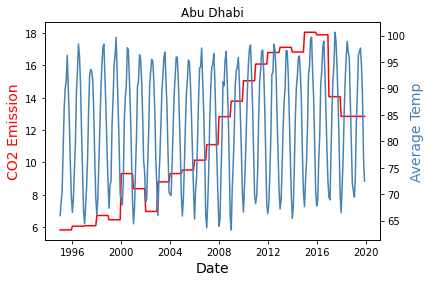

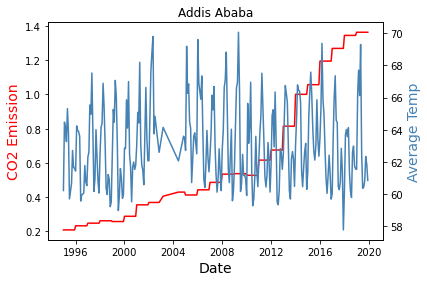

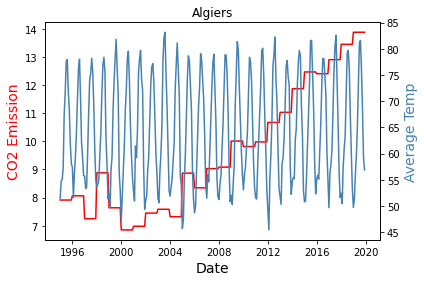

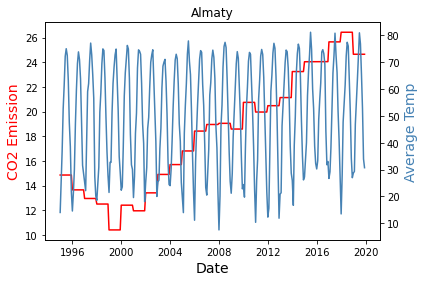

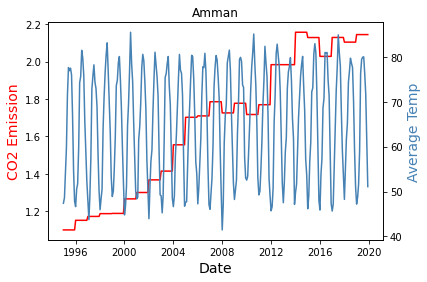

...

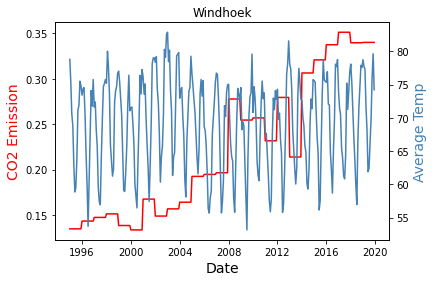

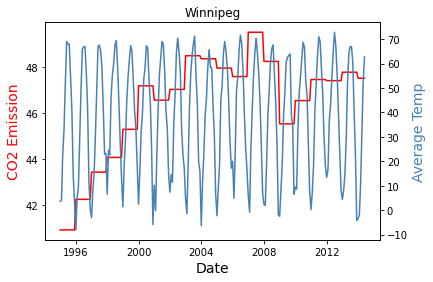

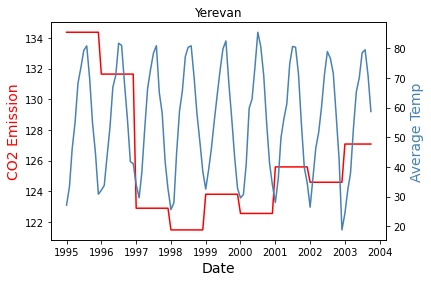

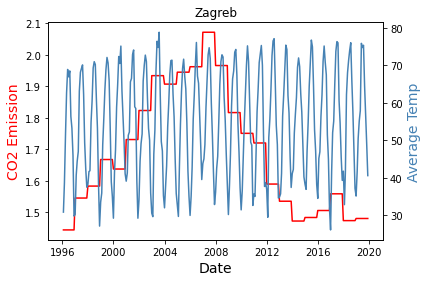

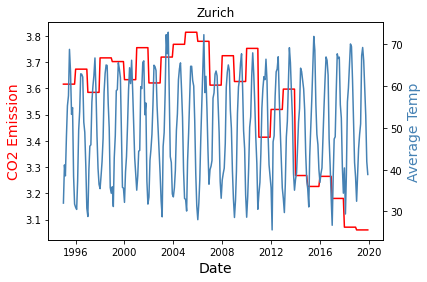

In [15]:
for df in df_list:
    fig,ax=plt.subplots()
    ax.plot(df.DATE,df.co2,color='red')
    Title=df.iloc[1,4]
    plt.title(Title)
    ax.set_xlabel('Date',fontsize=14)
    ax.set_ylabel('CO2 Emission',color='red',fontsize=14)
    ax2=ax.twinx()
    ax2.plot(df.DATE,df.AvgTemperature,color='steelblue')
    ax2.set_ylabel('Average Temp',color='steelblue',fontsize=14)

In [16]:
#yearly averages
dfTemp3=dfTemp.groupby(['Country','City','Year'],sort=False).mean()
dfTemp3=dfTemp3.reset_index()

Masteryear = pd.merge(dffossil,dfTemp3, on=['Country','Year'])
Masteryear=Masteryear.drop(columns=['Month'])
Masteryear = Masteryear[Masteryear.Year!=2020]

Masteryear

,Country,Year,population,co2,City,AvgTemperature
0,Albania,1997,3099747.0,1.532,Tirana,71.934783
1,Albania,1998,3110699.0,1.744,Tirana,61.612500
2,Albania,1999,3122700.0,2.975,Tirana,63.116961
3,Albania,2000,3129246.0,3.004,Tirana,63.176945
4,Albania,2001,3129701.0,3.221,Tirana,61.235600
...,...,...,...,...,...,...
3821,Zambia,2010,13605986.0,3.120,Lusaka,66.271781
3822,Zambia,2011,14023199.0,3.372,Lusaka,69.388857
3823,Zambia,2012,14465148.0,4.166,Lusaka,69.747658
3824,Zambia,2013,14926551.0,4.416,Lusaka,69.934164


In [17]:
df_list2 = [d for _, d in Masteryear.groupby(['City'])]
df_list2[0]

,Country,Year,population,co2,City,AvgTemperature
3598,United Arab Emirates,1995,2415099.0,70.012,Abu Dhabi,80.678082
3600,United Arab Emirates,1996,2539121.0,72.775,Abu Dhabi,81.808197
3602,United Arab Emirates,1997,2671361.0,73.101,Abu Dhabi,80.814521
3604,United Arab Emirates,1998,2813214.0,80.683,Abu Dhabi,83.730748
3606,United Arab Emirates,1999,2966029.0,77.544,Abu Dhabi,83.462088
3608,United Arab Emirates,2000,3134067.0,111.787,Abu Dhabi,82.622404
3610,United Arab Emirates,2001,3302722.0,100.591,Abu Dhabi,82.402192
3612,United Arab Emirates,2002,3478769.0,83.698,Abu Dhabi,82.863435
3614,United Arab Emirates,2003,3711931.0,105.619,Abu Dhabi,83.342466
3616,United Arab Emirates,2004,4068577.0,111.802,Abu Dhabi,83.036885


C:\Users\micke\AppData\Local\Temp\ipykernel_18624\3183618084.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax=plt.subplots()


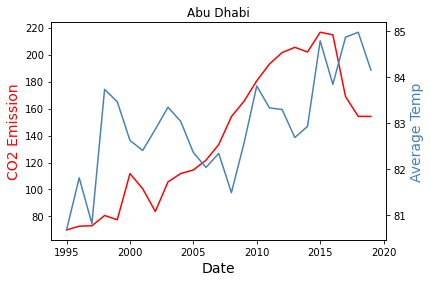

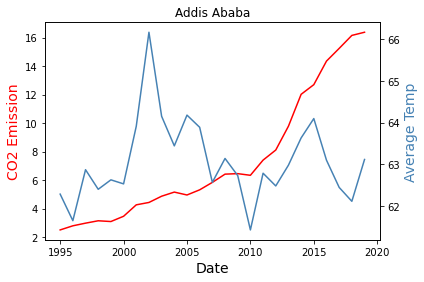

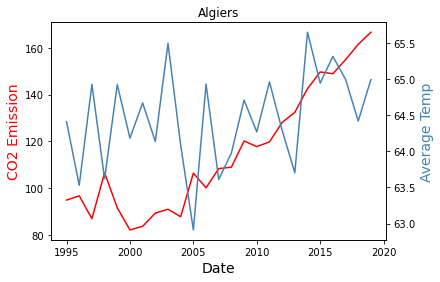

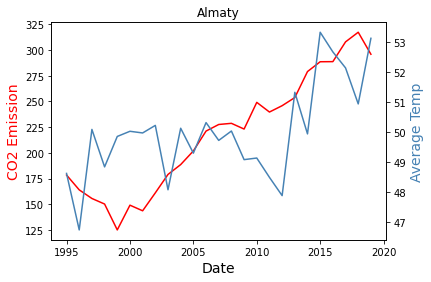

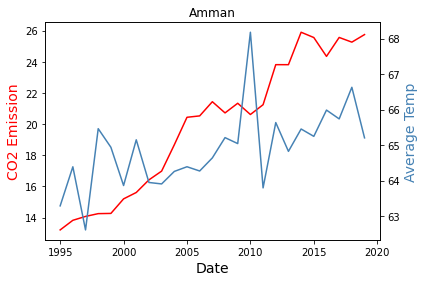

...

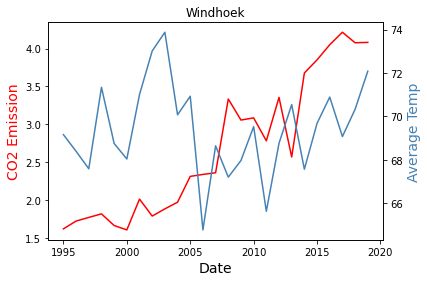

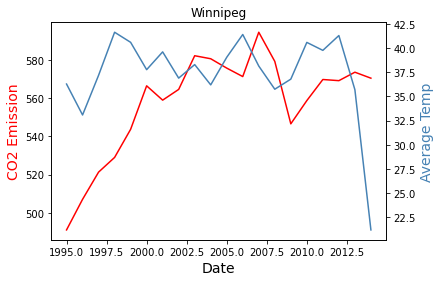

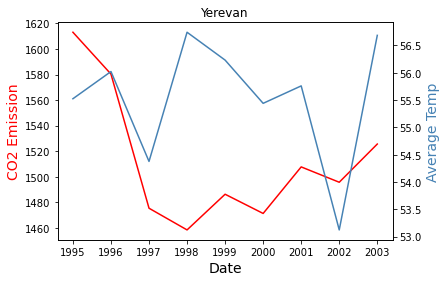

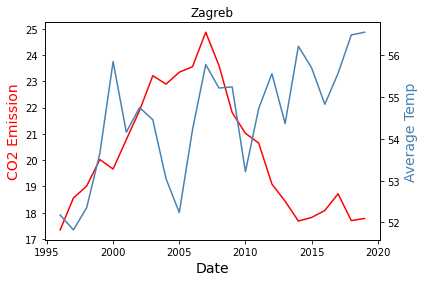

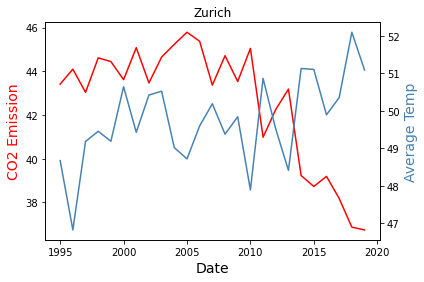

In [18]:
#yearly visualization
for df in df_list2:
    fig,ax=plt.subplots()
    ax.plot(df.Year,df.co2,color='red')
    Title=df.iloc[1,4]
    plt.title(Title)
    ax.set_xlabel('Date',fontsize=14)
    ax.set_ylabel('CO2 Emission',color='red',fontsize=14)
    ax2=ax.twinx()
    ax2.plot(df.Year,df.AvgTemperature,color='steelblue')
    ax2.set_ylabel('Average Temp',color='steelblue',fontsize=14)

In [19]:
#predict Co2
from sklearn.model_selection import train_test_split
import datetime as dt
Citylist=[]
Coeflist=[]
Interceptlist=[]
for df in df_list2:
    y=df['co2'].values
    X=df['Year'].values.reshape(-1,1)
    X_train,X_test,y_train, y_test = train_test_split(X,y, train_size = .7,random_state=42)
    model = LinearRegression()
    model.fit(X_train,y_train)
    model.score(X_train,y_train)
    
    Citylist.append(df.iloc[1,4])
    Coeflist.append(model.coef_)
    Interceptlist.append(model.intercept_)
Eqdf=pd.DataFrame({'City':Citylist,'Coef':Coeflist,"Intercept":Interceptlist})
Eqdf

    

,City,Coef,Intercept
0,Abu Dhabi,[6.3263460430667955],-12556.417402
1,Addis Ababa,[0.5971109587162255],-1191.074204
2,Algiers,[3.5357135509532305],-6980.659197
3,Almaty,[8.287724523384997],-16420.448522
4,Amman,[0.6088659991770676],-1202.038413
...,...,...,...
153,Windhoek,[0.12331010835276371],-244.811661
154,Winnipeg,[2.4194465478841845],-4288.788670
155,Yerevan,[-5.699493877551019],12903.419012
156,Zagreb,[-0.1509925742574258],323.389585


In [20]:
#graph CO2


In [21]:
#predict Temp
#predict Co2
Citylist2=[]
Coeflist2=[]
Interceptlist2=[]
for df in df_list2:
    y=df['AvgTemperature'].values
    X=df['Year'].values.reshape(-1,1)
    X_train,X_test,y_train, y_test = train_test_split(X,y, train_size = .7,random_state=42)
    model = LinearRegression()
    model.fit(X_train,y_train)
    model.score(X_train,y_train)
    
    Citylist2.append(df.iloc[1,4])
    Coeflist2.append(model.coef_)
    Interceptlist2.append(model.intercept_)
Eqdf2=pd.DataFrame({'City':Citylist2,'Coef':Coeflist2,"Intercept":Interceptlist2})
Eqdf2

,City,Coef,Intercept
0,Abu Dhabi,[0.0844176070261095],-86.353298
1,Addis Ababa,[-0.01247386380834005],88.182569
2,Algiers,[0.03579474844892439],-7.410101
3,Almaty,[0.12513963129710232],-200.883127
4,Amman,[0.07948954893834642],-94.527982
...,...,...,...
153,Windhoek,[0.014697226758972242],40.217370
154,Winnipeg,[-0.5177652197397917],1075.394776
155,Yerevan,[0.1605499893436149],-265.025642
156,Zagreb,[0.09719870391757765],-140.464102


In [ ]:
#graph Temp